<a href="https://colab.research.google.com/github/riskakurniaa/PCVK_Ganjil_2024/blob/main/Modul3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama  : **Riska Kurnia Triwulandari**  
Kelas : **3A**  
NIM   : **2241720039**

##Praktikum

Akses folder images pada Google Drive

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

##Transformasi Linier Brightness
Formula: g(x,y)=f(x,y)+b
g(x,y) adalah nilai pixel setelah transformasi, f(x,y) adalah nilai pixel asli, b adalah nilai brightness

 Mengubah tingkat kecerahan citra
---------------------------------
Masukkan nilai kecerahan: 50


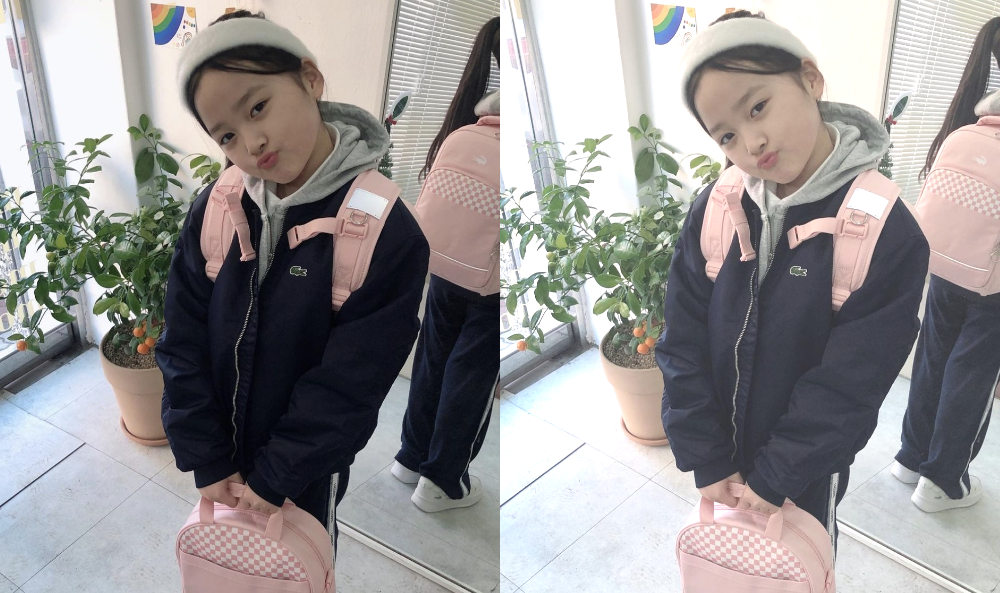

In [ ]:
print(' Mengubah tingkat kecerahan citra')
print('---------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/cute.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta-brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

##Tugas

Inverse citra

Mengubah warna menjadi negatif
------------------------------


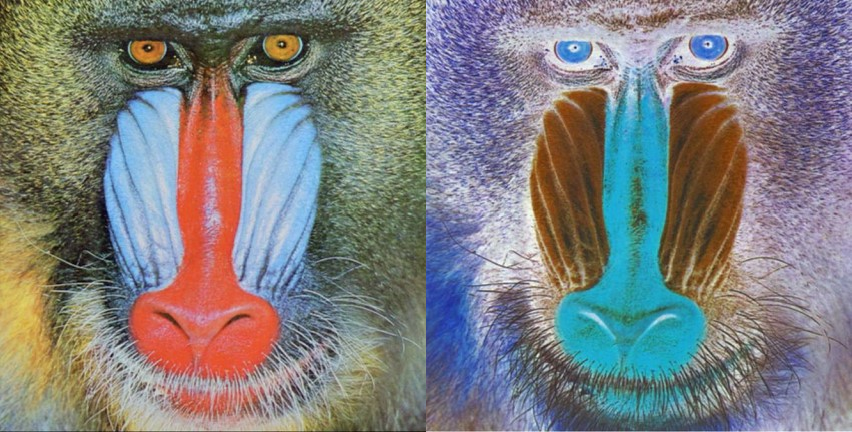

In [ ]:
print('Mengubah warna menjadi negatif')
print('------------------------------')
ktp = cv.imread('/content/drive/MyDrive/PCVK/Images/hewan.jpg') # membaca gambar
inverse = ktp.copy() # membuat salinan gambar asli untuk gambar manipulasi
for y in range(ktp.shape[0]): # iterasi baris gambar
  for x in range(ktp.shape[1]): # iterasi kolom gambar
    for c in range(ktp.shape[2]): # iterasi warna (R, G, B) di setiap pixel
      inverse[y,x,c] = np.clip(255-ktp[y,x,c],0,255) # formula untuk membalikkan warna gambar yaitu g(x)=255-f(x)

final_frame = cv.hconcat((ktp, inverse)) # menggabungkan 2 gambar menjadi 1
cv2_imshow(final_frame) # menampilkan gambar

Transformasi contrast

Mengubah kontras dan tingkat kecerahan citra
--------------------------------------------
Masukkan nilai kecerahan [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


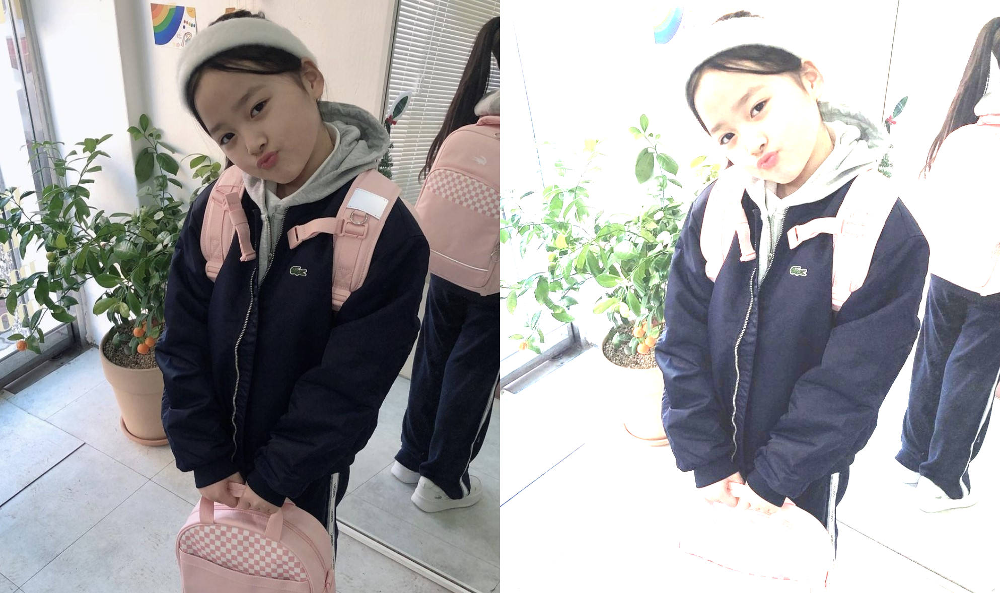

In [ ]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------------------')

try:  # untuk menangani error
    brightness = int(input('Masukkan nilai kecerahan [-255 - 255]: '))  # membuat inputan user
    contrast = float(input('Masukkan kontras [1.0 - 3.0]: '))  # kontras dengan tipe float
except ValueError:  # menjalankan kode ketika error
    print('Error, not a number')  # menampilkan pesan error

# Mengambil gambar dari Google Drive
ori = cv.imread('/content/drive/MyDrive/PCVK/Images/cute.jpg')  # Membaca gambar dari lokasi yang diinginkan

constrast_img = ori.copy()  # membuat salinan gambar asli untuk gambar manipulasi

# Iterasi setiap pixel pada gambar
for y in range(ori.shape[0]):  # iterasi baris gambar
    for x in range(ori.shape[1]):  # iterasi kolom gambar
        for c in range(ori.shape[2]):  # iterasi warna (R, G, B) di setiap pixel
            constrast_img[y, x, c] = np.clip(contrast * ori[y, x, c] + brightness, 0, 255)  # manipulasi kontras dan kecerahan

# Menggabungkan gambar asli dan yang sudah dimanipulasi
final_frame = cv.hconcat((ori, constrast_img))  # menggabungkan 2 gambar menjadi 1
cv2_imshow(final_frame)  # menampilkan gambar

Transformasi logarithmic

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 50


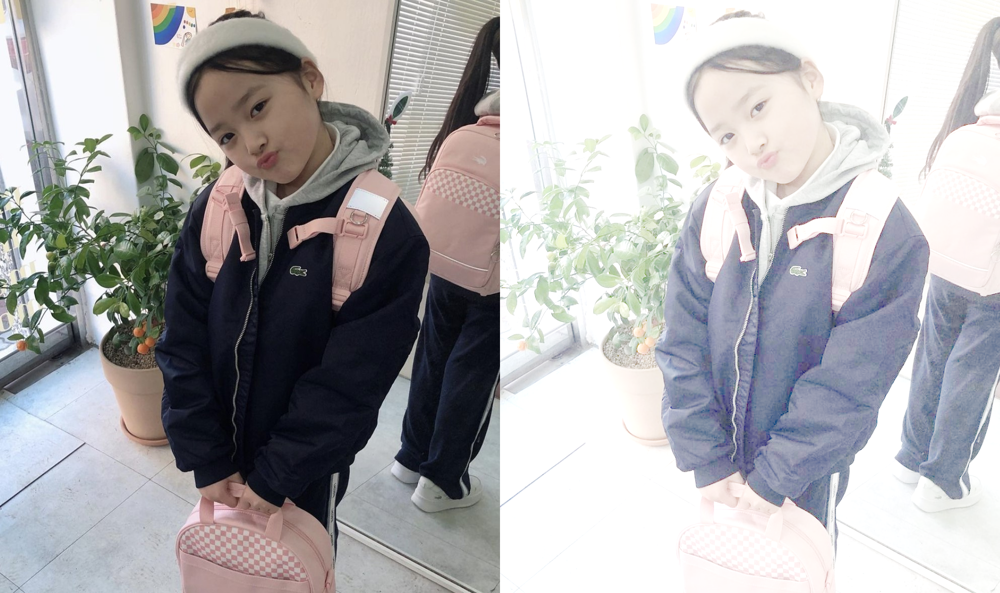

In [ ]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('--------------------------------------------------------')
try: # untuk menangani error
  brightness = int(input('Masukkan nilai kecerahan: ')) # membuat inputan user
except ValueError: # menjalankan kode ketika error
  print('Error, not a number') # menampilkan message, penanda error

brightness_img = ori.copy()  # membuat salinan gambar asli untuk gambar manipulasi

for y in range(ori.shape[0]): # iterasi baris gambar
  for x in range(ori.shape[1]): # iterasi kolom gambar
    for c in range(ori.shape[2]): # iterasi warna (R, G, B) di setiap pixel
      r = ori[y,x,c] # nilai grey-level input gambar
      brightness_img[y,x,c] = np.clip(brightness*np.log(1+r),0,255) # formula untuk logarithmic brightness yaitu s=c*log(1+r)

final_frame = cv.hconcat((ori, brightness_img)) # menggabungkan 2 gambar menjadi 1
cv2_imshow(final_frame) # menampilkan gambar

 Transformasi grayscale
*   Averaging



Grayscale Average
--------------------------------------------------------


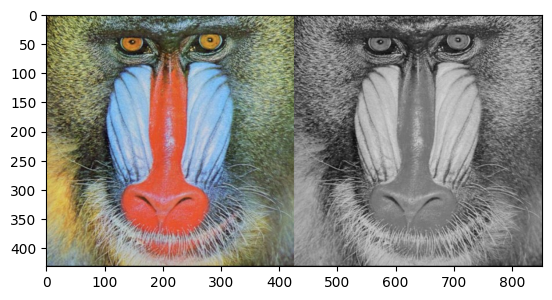

In [ ]:
print('Grayscale Average')
print('--------------------------------------------------------')

# Membaca Image
ori = cv.imread('/content/drive/MyDrive/PCVK/Images/hewan.jpg')
# merubah color dari BGR ke RBG
ori = cv.cvtColor(ori, cv.COLOR_BGR2RGB)

# membuat array dengan range yang sama dengan gambar
grey_scale_avg = np.zeros(ori.shape, ori.dtype)

# Range Tinggi gambar
for y in range(ori.shape[0]):
  # Range Lebar gambar
  for x in range(ori.shape[1]):
    # merubah RGB menjadi grayscale dengan rumus Average
    grey_scale_avg[y,x] = np.sum(ori[y, x]) / 3

# Menggabungkan 2 gambar menjadi 1
final_gray_avg = cv.hconcat((ori, grey_scale_avg))
# menampilkan gambar
plt.imshow(final_gray_avg)

*   Lightness

Grayscale Lightness
--------------------------------------------------------


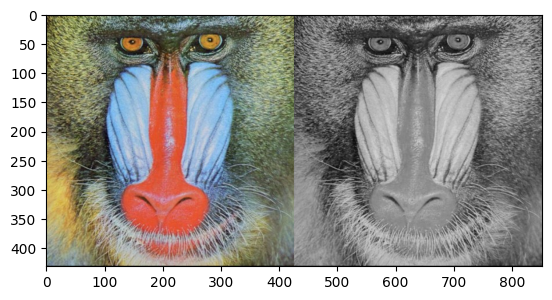

In [ ]:
print('Grayscale Lightness')
print('--------------------------------------------------------')

# Membaca Image
ori = cv.imread('/content/drive/MyDrive/PCVK/Images/hewan.jpg')
# merubah color dari BGR ke RBG
ori = cv.cvtColor(ori, cv.COLOR_BGR2RGB)

# membuat array dengan range yang sama dengan gambar
grey_scale_light = np.zeros(ori.shape, ori.dtype)

# Range Tinggi gambar
for y in range(ori.shape[0]):
  # Range Lebar gambar
  for x in range(ori.shape[1]):
    # merubah RGB menjadi grayscale dengan rumus Lightness
    grey_scale_light[y,x] = np.mean([np.max(ori[y, x]), np.min(ori[y, x])])

# Menggabungkan 2 gambar menjadi 1
final_gray_light = cv.hconcat((ori, grey_scale_light))
# menampilkan gambar
plt.imshow(final_gray_light)

*   Luminance

Grayscale Luminance
--------------------------------------------------------


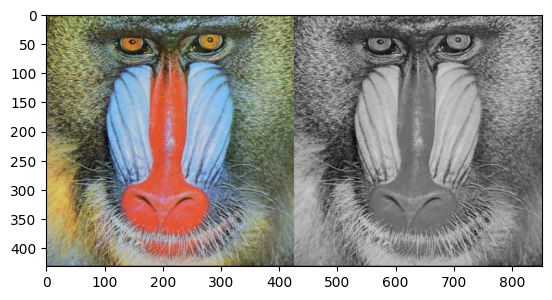

In [ ]:
print('Grayscale Luminance')
print('--------------------------------------------------------')

# Membaca Image
ori = cv.imread('/content/drive/MyDrive/PCVK/Images/hewan.jpg')
# merubah color dari BGR ke RBG
ori = cv.cvtColor(ori, cv.COLOR_BGR2RGB)

# membuat array dengan range yang sama dengan gambar
grey_scale_lum = np.zeros(ori.shape, ori.dtype)

# Range Tinggi gambar
for y in range(ori.shape[0]):
  # Range Lebar gambar
  for x in range(ori.shape[1]):
    # merubah RGB menjadi grayscale dengan rumus Luminance
    grey_scale_lum[y,x] = int(0.21 * ori[y, x][0] + 0.72 * ori[y, x][1] + 0.07 * ori[y, x][2])

# Menggabungkan 2 gambar menjadi 1
final_gray_lumin = cv.hconcat((ori, grey_scale_lum))
# menampilkan gambar
plt.imshow(final_gray_lumin)

Tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale

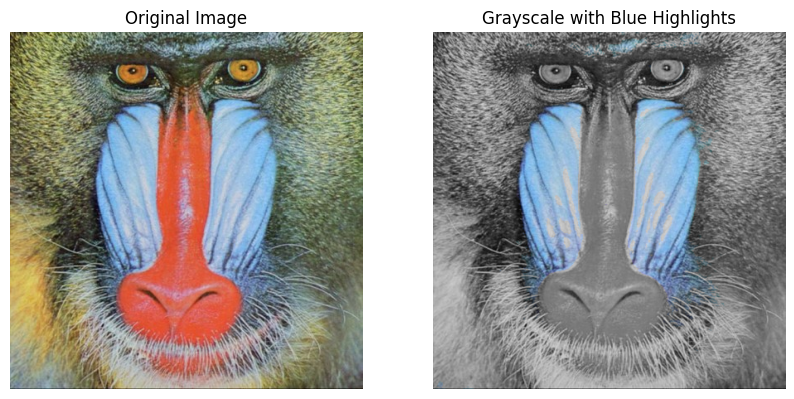

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Memuat gambar
image = cv2.imread('/content/drive/MyDrive/PCVK/Images/hewan.jpg')

# Mengonversi gambar dari BGR ke RGB karena OpenCV menggunakan BGR secara default
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Mengonversi gambar dari RGB ke HSV untuk pemilihan warna yang lebih baik
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Membuat masker untuk bagian biru menggunakan nilai HSV
lower_blue = np.array([90, 50, 50])  # Nilai minimum untuk biru (Hue, Saturation, Value)
upper_blue = np.array([130, 255, 255])  # Nilai maksimum untuk biru

mask_blue = cv2.inRange(image_hsv, lower_blue, upper_blue)

# Membuat gambar grayscale
gray_image = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
gray_image_rgb = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2RGB)

# Menggabungkan gambar grayscale dengan bagian berwarna biru
colored_part = cv2.bitwise_and(image_rgb, image_rgb, mask=mask_blue)
gray_part = cv2.bitwise_and(gray_image_rgb, gray_image_rgb, mask=cv2.bitwise_not(mask_blue))
result_image = cv2.add(colored_part, gray_part)

# Plot kedua gambar: gambar asli dan hasil manipulasi
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(result_image)
axes[1].set_title('Grayscale with Blue Highlights')
axes[1].axis('off')

plt.show()